# Figures for Experiment 4.2

## Includes

In [1]:
using CSV
using DataFrames
using Random

In [2]:
using Gadfly
using Compose
import Cairo, Fontconfig

In [3]:
ENV["COLUMNS"] = 1000;

## Helper Functions

In [4]:
subsample_df(df, k) = df[randperm(nrow(df))[1:k],:];

In [5]:
function make_horizontal_key(labels, colors; debug=false, height=22px, title=nothing)
    n = length(labels)

    key_labels = []

    _boxsize = height
    _fontsize = 0.8 * _boxsize
    _padding_between = 20px
    _padding_inside = 5px
    _font = defaultfont
    z = 1.2

    ws = [_boxsize + _padding_inside + _padding_between + z*text_extents(_font, _fontsize, l)[1][1] for l in labels]
    tot_w = sum(ws) - _padding_between
    pad_left = (1w - tot_w) / 2

    debug_box_outside = !debug ? nothing : compose(context(0, 0, 1, 1), rectangle(), fill(nothing), stroke("black"))

    x = pad_left
    for i in 1:n
        txt_ext = text_extents(_font, _fontsize, labels[i])[1]
        _w = _boxsize + _padding_inside + z*txt_ext[1]
        width = _w + _padding_between
        debug_box_inside = !debug ? nothing : compose(context(0, 0, 1, 1), rectangle(0, 0, _w, 1), stroke("black"), fill(nothing))
        label = compose(
            context(x, 0, width, 1h),
            compose(
                context(0, 0, _boxsize, _boxsize),
                rectangle(),
                fill(colors[i]),
            ),
            compose(
                context(0, 0, 1w, 1h),
                text(_boxsize + _padding_inside, _boxsize/2, labels[i], hleft, vcenter),
                fontsize(_fontsize),
                font(_font),
            ),
            debug_box_inside,
        )
        push!(key_labels, label)
        x += width
    end

    key = compose(
        context(0, 0, 1, 1),
        key_labels...,
        debug_box_outside,
    )
    
    if !isnothing(title)
        _titlefontsize = 1.1 * _fontsize
        key, title_height = add_title_top(title, key, top_margin=5px, bottom_margin=5px, font_size=_titlefontsize)
    else
        title_height = 0px
    end
    total_height = height + title_height

    return key, total_height
end;

In [6]:
function add_title_top(title, plt; font_size=22px, top_margin=10px, bottom_margin=15px)
    title_font = defaultfont
    totalsize = top_margin + font_size + bottom_margin

    plot = compose(
        context(0, 0, 1w, 1h),
        compose(context(0, 0, 1w, 1h), text(0.5w, top_margin, title, hcenter, vtop), fontsize(font_size), font(title_font)),
        compose(context(0, totalsize, 1w, 1h - totalsize), plt),
    )
    return plot, totalsize
end;

In [7]:
function add_key_bottom(key, _plot; topmargin=15px, keyheight=22px)
    totalsize = topmargin + keyheight
    plot = compose(
        context(0, 0, 1w, 1h),
        compose(context(0, 0, 1w, 1h - totalsize), _plot),
        compose(context(0, 1h - keyheight, 1w, keyheight), key),
    )
    return plot, totalsize
end;

## Style

In [8]:
defaultfont = "CMU Serif";
defaultfontstyle = (
    key_title_font = defaultfont,
    key_label_font = defaultfont,
    minor_label_font = defaultfont,
    major_label_font = defaultfont,
    key_title_font_size = 14px,
    key_label_font_size = 12px,
    minor_label_font_size = 14px,
    major_label_font_size = 16px,
);

## Load Data

In [9]:
results_exp42 = DataFrame(CSV.File("../results/experiment_4_2/simulatons-10-45-27.csv"));

In [10]:
results_exp42.match_color = map(results_exp42.match_ratio) do x
    if x ≈ 1.0
        return 2
    elseif x >= 0.85
        return 1
    else
        return 0
    end
end;

In [11]:
@show nrow(results_exp42)
first(results_exp42, 3)

nrow(results_exp42) = 142065


,N,n,m,μ′,α,β,δ,beta_params_key,ρe,ρh,ρt,μ,σ,match_ratio,alignment_strength_1,alignment_strength_2,iter,maxiter,sgm_time,distribution,experiment,match_color
,Int64,Int64,Int64,Float64,Float64,Float64,Float64,String,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Int64,Int64,Float64,String,String,Int64
1,1000,1000,0,0.1,1.0,1.0,0.0,A,0.0,0.000111099,0.000111099,0.0999,0.0031607,0.003,0.1389,0.1389,20,20,18.7236,bernoulli,42a,0
2,1000,1000,0,0.1,1.0,1.0,0.02,A,0.0,0.000482365,0.000482365,0.0999138,0.00658632,0.001,0.138881,0.138881,20,20,18.1971,bernoulli,42a,0
3,1000,1000,0,0.1,1.0,1.0,0.04,A,0.0,0.00159271,0.00159271,0.0998814,0.0119663,0.0,0.139608,0.139608,20,20,18.1733,bernoulli,42a,0


In [12]:
mvals = sort(unique(results_exp42.m));

## Plots

In [13]:
figurespath = "./figures/tex/"
if !isdir(figurespath) mkpath(figurespath) end;

In [14]:
colors = [colorant"red", colorant"blue", colorant"green"]

In [15]:
results_exp42_fig1 = filter(row -> (row.μ′ == 0.5), results_exp42)
sort!(results_exp42_fig1, [:match_color, :m])
fig1 = plot(
    results_exp42_fig1,
    x = :ρt, y = :alignment_strength_1, xgroup = :m, color = :match_color,
    Geom.subplot_grid(Geom.point, Guide.xticks(ticks=0:0.25:1), Guide.yticks(ticks=0:0.25:1)),
    Scale.color_discrete(x -> colors),
    Guide.xlabel("Total Correlation (ρ<sub>T</sub>)"),
    Guide.ylabel("Alignment Strength"),
    Guide.colorkey(title="Match Ratio", labels=["&lt;85%", "≥85%", "100%"]),
    Scale.xgroup(labels=m -> "s=$(m)", levels=mvals),
    style(
        point_size=0.5mm,
        highlight_width=0px,
        ;defaultfontstyle...,
    ),
)
# fig1 |> SVG(42cm, 10cm);
fig1 |> PGF(joinpath(figurespath, "exp42_fig1_v1.tex"), 42cm, 10cm, texfonts=true);

In [16]:
results_exp42_fig1 = filter(row -> (row.μ′ == 0.5), results_exp42)
sort!(results_exp42_fig1, [:match_color, :m])

plts = Plot[]
for m in mvals
    results_exp42_fig1_m = filter(row -> row.m == m, results_exp42_fig1)
    p = plot(
        results_exp42_fig1_m,
        x = :ρt, y = :alignment_strength_1, color = :match_color,
        Geom.point,
        Guide.xticks(ticks=0:0.25:1), Guide.yticks(ticks=0:0.25:1),
        Scale.color_discrete_manual(colors..., levels=[0,1,2]),
        Guide.ylabel("Alignment Strength"),
        Guide.xlabel("Total Correlation (ρ<sub>T</sub>)"),
        Guide.title("s=$(m)"),
        style(
            key_position=:none,

            point_size      = 0.5mm,
            highlight_width = 0.0px,

            ;defaultfontstyle...,
        ),
    )
    push!(plts, p)
end

fig1_stacked_alt = compose(
    context(0, 0, 1w, 1h),
    compose(
        context(0, 0, 1w, 0.5h),
        compose(context(0/4, 0, 1/4, 1), render(plts[1])),
        compose(context(1/4, 0, 1/4, 1), render(plts[2])),
        compose(context(2/4, 0, 1/4, 1), render(plts[3])),
        compose(context(3/4, 0, 1/4, 1), render(plts[4])),
    ),
    compose(
        context(0.125w, 0.5h, 0.75w, 0.5h),
        compose(context(0/3, 0, 1/3, 1), render(plts[5])),
        compose(context(1/3, 0, 1/3, 1), render(plts[6])),
        compose(context(2/3, 0, 1/3, 1), render(plts[7])),
    ),
)

fig1_stacked_key, fig1_stacked_key_height = make_horizontal_key(["&lt;85%", "≥85%", "100%"], colors, title="Match Ratio", height=18px)
fig1_stacked_alt, fig1_stacked_key_height = add_key_bottom(fig1_stacked_key, fig1_stacked_alt; topmargin=0px, keyheight=fig1_stacked_key_height)

fig1_stacked_width = 38cm
fig1_stacked_height = 18cm + fig1_stacked_key_height

# fig1_stacked_alt |> SVG(fig1_stacked_width, fig1_stacked_height)
fig1_stacked_alt |> PGF(joinpath(figurespath, "exp42_fig1_v2.tex"), fig1_stacked_width, fig1_stacked_height, texfonts=true);

In [17]:
results_exp42_fig1 = filter(row -> (row.μ′ == 0.5), results_exp42)
sort!(results_exp42_fig1, [:match_color, :m])

letters = ['a' + i for i in 0:7];

plts = Plot[]
for (i,m) in enumerate(mvals)
    results_exp42_fig1_m = filter(row -> row.m == m, results_exp42_fig1)
    p = plot(
        results_exp42_fig1_m,
        x = :ρt, y = :alignment_strength_1, color = :match_color,
        Geom.point,
        Guide.xticks(ticks=0:0.25:1), Guide.yticks(ticks=0:0.25:1),
        Scale.color_discrete_manual(colors..., levels=[0,1,2]),
        Guide.xlabel("Total Correlation (ρ<sub>T</sub>)"),
        Guide.ylabel("Alignment Strength"),
        Guide.title("($(letters[i])) s=$(m)"),
        style(
            key_position=:none,

            point_size=0.5mm,
            highlight_width=0px,

            ;defaultfontstyle...,
        ),
    )
    push!(plts, p)
end

results_exp42_fig3 = filter(row -> (row.μ′ == 0.5) && (row.m == 50), results_exp42)
sort!(results_exp42_fig3, [:match_color])
fig3 = plot(
    results_exp42_fig3,
    x = :ρe, y = :alignment_strength_1, color = :match_color,
    Geom.point,
    Scale.color_discrete(x -> colors[[1,3]]),
    Guide.xlabel("Edge Correlation (ρ<sub>E</sub>)"),
    Guide.ylabel("Alignment Strength"),
    Guide.title("(h) s=50"),
    Guide.xticks(ticks=0:0.25:1), Guide.yticks(ticks=0:0.25:1),
    style(
        key_position=:none,
        
        point_size=0.5mm,
        highlight_width=0px,
        
        ;defaultfontstyle...,
    ),
)
push!(plts, fig3)

fig1_stacked = gridstack(permutedims(reshape(plts, (2,4)), (2,1)))

fig1_stacked_key, fig1_stacked_key_height = make_horizontal_key(["&lt;85%", "≥85%", "100%"], colors, title="Match Ratio", height=18px)
fig1_stacked, fig1_stacked_key_height = add_key_bottom(fig1_stacked_key, fig1_stacked; topmargin=0px, keyheight=fig1_stacked_key_height)

fig1_stacked_width = 24cm
fig1_stacked_height = 38cm + fig1_stacked_key_height

# fig1_stacked |> SVG(fig1_stacked_width, fig1_stacked_height)
fig1_stacked |> PGF(joinpath(figurespath, "exp42_fig1_v3.tex"), fig1_stacked_width, fig1_stacked_height, texfonts=true);

In [18]:
results_exp42_fig2 = filter(row -> (row.μ′ == 0.5), results_exp42)
sort!(results_exp42_fig2, [:m, :match_color])
fig2 = plot(
    results_exp42_fig2,
    x = :ρt, y = :alignment_strength_1, color = :m,
    Geom.point,
    Scale.color_discrete,
    Guide.xlabel("Total Correlation (ρ<sub>T</sub>)"),
    Guide.ylabel("Alignment Strength"),
    Guide.xticks(ticks=0:0.25:1), Guide.yticks(ticks=0:0.25:1),
    Guide.colorkey(title="s"),
    style(
        point_size=0.4mm,
        highlight_width=0px,
        
        ;defaultfontstyle...,
    ),
)
# fig2 |> SVG(16cm, 10cm);
fig2 |> PGF(joinpath(figurespath, "exp42_fig2.tex"), 16cm, 10cm, texfonts=true);

In [19]:
results_exp42_fig3 = filter(row -> (row.μ′ == 0.5) && (row.m == 50), results_exp42)
sort!(results_exp42_fig3, [:match_color])
colors = [colorant"red", colorant"blue", colorant"green"]
fig3 = plot(
    results_exp42_fig3,
    x = :ρe, y = :alignment_strength_1, color = :match_color,
    Geom.point,
    Scale.color_discrete(x -> colors[[1,3]]),
    Guide.xlabel("Edge Correlation (ρ<sub>E</sub>)"),
    Guide.ylabel("Alignment Strength"),
    Guide.xticks(ticks=0:0.25:1), Guide.yticks(ticks=0:0.25:1),
    Guide.manual_color_key("Match Ratio", ["&lt;85%", "≥85%", "100%"], colors, shape=[Shape.square], size=[1.0mm]),
    style(
        key_position=:none,
        
        point_size=0.5mm,
        highlight_width=0.0px,
        
        ;defaultfontstyle...,
    ),
)
fig3 |> SVG(16cm, 10cm);
fig3 |> PGF(joinpath(figurespath, "exp42_fig3_v1.tex"), 16cm, 10cm, texfonts=true);

In [20]:
results_exp42_fig3 = filter(row -> (row.μ′ == 0.5) && (row.m == 50), results_exp42)
sort!(results_exp42_fig3, [:match_color])
colors = [colorant"red", colorant"blue", colorant"green"]
fig3 = plot(
    results_exp42_fig3,
    x = :ρe, y = :alignment_strength_1, color = :match_color,
    Geom.point,
    Scale.color_discrete(x -> colors[[1,3]]),
    Guide.xlabel("Edge Correlation (ρ<sub>E</sub>)"),
    Guide.ylabel("Alignment Strength"),
    Guide.xticks(ticks=0:0.25:1), Guide.yticks(ticks=0:0.25:1),
    style(
        key_position=:none,
        
        point_size=0.5mm,
        highlight_width=0.0px,
        
        ;defaultfontstyle...,
    ),
)
# fig3 |> SVG(14cm, 10cm);
fig3 |> PGF(joinpath(figurespath, "exp42_fig3_v2.tex"), 14cm, 10cm, texfonts=true);

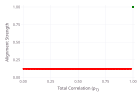

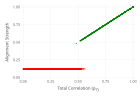

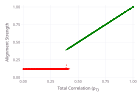

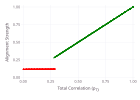

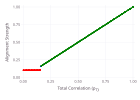

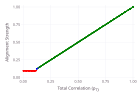

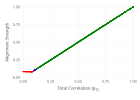

In [21]:
results_exp42_fig1 = filter(row -> (row.μ′ == 0.5), results_exp42)
sort!(results_exp42_fig1, [:match_color, :m])

letters = ['a' + i for i in 0:7];

for (i,m) in enumerate(mvals)
    results_exp42_fig1_m = filter(row -> row.m == m, results_exp42_fig1)
    plt = plot(
        results_exp42_fig1_m,
        x = :ρt, y = :alignment_strength_1, color = :match_color,
        Geom.point,
        Guide.xticks(ticks=0:0.25:1), Guide.yticks(ticks=0:0.25:1),
        Scale.color_discrete_manual(colors..., levels=[0,1,2]),
        Guide.xlabel("Total Correlation (ρ<sub>T</sub>)"),
        Guide.ylabel("Alignment Strength"),
        style(
            key_position=:none,
            point_size=0.5mm,
            highlight_width=0px,
            point_shapes=[Shape.circle],
            ;defaultfontstyle...,
        ),
    )
    
    plt |> SVG(14cm, 10cm)
    plt |> PGF(joinpath(figurespath, "exp42_fig4_v1_s$(m).tex"), 14cm, 10cm, texfonts=true)
end

In [22]:
plt, _ = make_horizontal_key(["&lt;85%", "≥85%", "100%"], colors, title="Match Ratio", height=18px)
plt |> SVG(14cm, 1.5cm)
plt |> PGF(joinpath(figurespath, "exp42_fig4_v1_legend.tex"), 14cm, 1.5cm, texfonts=true);